In [53]:
"""
Imports de librairies
"""
%matplotlib inline
import matplotlib.pyplot as plt
from scipy.stats import bernoulli
import numpy as np
import math
import scipy.stats
import random 
import scipy
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import community.community_louvain as cl
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import statistics

In [3]:
"""
Spec des fichiers :
    h1 is the household of member 1; h1=[L, F, E, B, H]
    m1 is the anonymous ID number of member 1;
    h2 is the household of member 2; h2=[L, F, E, B, H]
    m2 is the anonymous ID number of member 2;
    age1 is the age of member 1; age1 = [0, 1, 2, 3, 4]
    age2 is the age of member 2; age2 = [0, 1, 2, 3, 4]
    sex1 is the gender of member 1; sex1 = [F, M]
    sex2 is the gender of member 2; sex2 = [F, M]
    duration is the duration of the contact event in seconds;
    day is the day of experiment; day = [1, 2, 3]
    hour is the day time of the contact event; hour = [7 – 20]

Variables Dictionary
========

Households.
There are 5 households in the dataset. They are labelled as L, F, E, B and H, by increasing size.
Members of households L, F and E wore the sensors during overlapping time windows.

Age.
Membersâ€™ age is indicated with numbers from 0 to 4 corresponding the following age brackets:
0 - from 0 to 5 years old;
1 - from 6 to 14 years old;
2 - from 15 to 19 years old;
3 - from 20 to 49 years old;
4 - 50 and older.

Day of experiment.
Contact data has been collected over three consecutive days for each household that are indicated as Day 1, Day 2, Day 3 and correspond to:
L = [25/04/2012, 26/04/2012, 27/04/2012]
F = [26/04/2012, 27/04/2012, 28/04/2012]
E = [27/04/2012, 28/04/2012, 29/04/2012]
B = [03/05/2012, 04/05/2012, 05/05/2012]
H = [09/05/2012, 10/05/2012, 11/05/2012]

Hour.
Only contact events recorded between 6am and 8pm are reported.
Hours are indicated by integers corresponding to the end of the time interval:
- 7 = from 6am to 7am
- 8 = from 7am to 8am
â€¦
- 20 = from 7pm to 8pm

"""

'\nSpec des fichiers :\n    h1 is the household of member 1; h1=[L, F, E, B, H]\n    m1 is the anonymous ID number of member 1;\n    h2 is the household of member 2; h2=[L, F, E, B, H]\n    m2 is the anonymous ID number of member 2;\n    age1 is the age of member 1; age1 = [0, 1, 2, 3, 4]\n    age2 is the age of member 2; age2 = [0, 1, 2, 3, 4]\n    sex1 is the gender of member 1; sex1 = [F, M]\n    sex2 is the gender of member 2; sex2 = [F, M]\n    duration is the duration of the contact event in seconds;\n    day is the day of experiment; day = [1, 2, 3]\n    hour is the day time of the contact event; hour = [7 – 20]\n\nVariables Dictionary\n========\n\nHouseholds.\nThere are 5 households in the dataset. They are labelled as L, F, E, B and H, by increasing size.\nMembers of households L, F and E wore the sensors during overlapping time windows.\n\nAge.\nMembersâ€™ age is indicated with numbers from 0 to 4 corresponding the following age brackets:\n0 - from 0 to 5 years old;\n1 - from

In [4]:
"""
import d'un csv
"""
data_1 = pd.read_csv("scc2034_kilifi_all_contacts_within_households.csv", sep=",", header=0)
data_2 = pd.read_csv("scc2034_kilifi_all_contacts_across_households.csv", sep=",", header=0)

data_1.columns = ['Maison1_1', 'ID1_1','Maison2_1', 'ID2_1','age1_1', 'age2_1', 'genre1_1', 'genre2_1', 'duration_1', 'day_1', 'hour_1']
data_2.columns = ['Maison1_2', 'ID1_2','Maison2_2', 'ID2_2','age1_2', 'age2_2', 'genre1_2', 'genre2_2', 'duration_2', 'day_2', 'hour_2']
data_1

,Maison1_1,ID1_1,Maison2_1,ID2_1,age1_1,age2_1,genre1_1,genre2_1,duration_1,day_1,hour_1
0,E,2,E,4,0,1,M,M,20,1,12
1,E,2,E,4,0,1,M,M,40,1,12
2,E,2,E,4,0,1,M,M,20,1,9
3,E,2,E,4,0,1,M,M,20,1,12
4,E,2,E,4,0,1,M,M,40,1,9
...,...,...,...,...,...,...,...,...,...,...,...
32420,B,58,B,8,1,1,F,F,20,3,17
32421,B,58,B,8,1,1,F,F,20,3,17
32422,B,58,B,8,1,1,F,F,20,3,17
32423,B,58,B,8,1,1,F,F,20,3,17


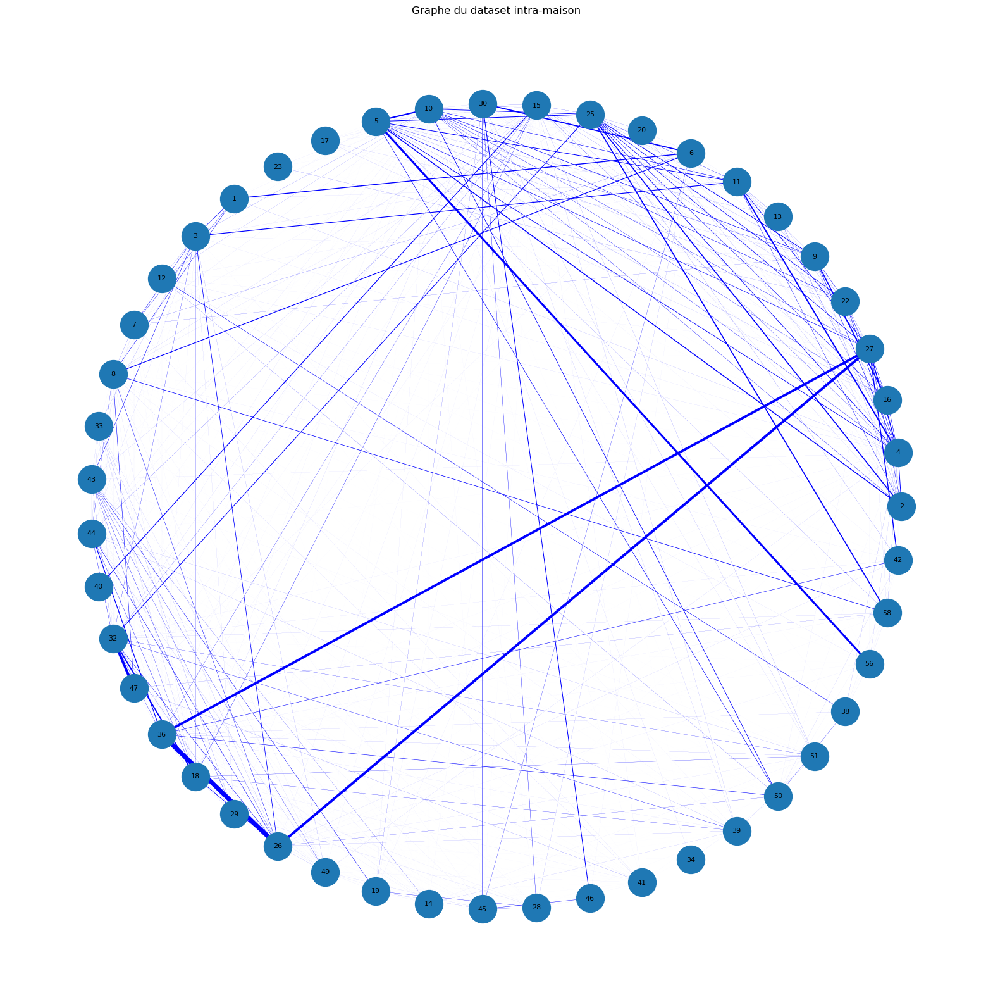

In [5]:
"""
Graphe basique des contacts dataset 1
"""
# Create a graph
G = nx.Graph()

# Add nodes and weighted edges based on the amount of contact
for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'])
    G.add_node(row['ID2_1'])
    contact_weight = row['duration_1']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(20, 20))  # You can adjust the size as needed

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_size=1000)
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)


# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Graphe du dataset intra-maison")
plt.show()

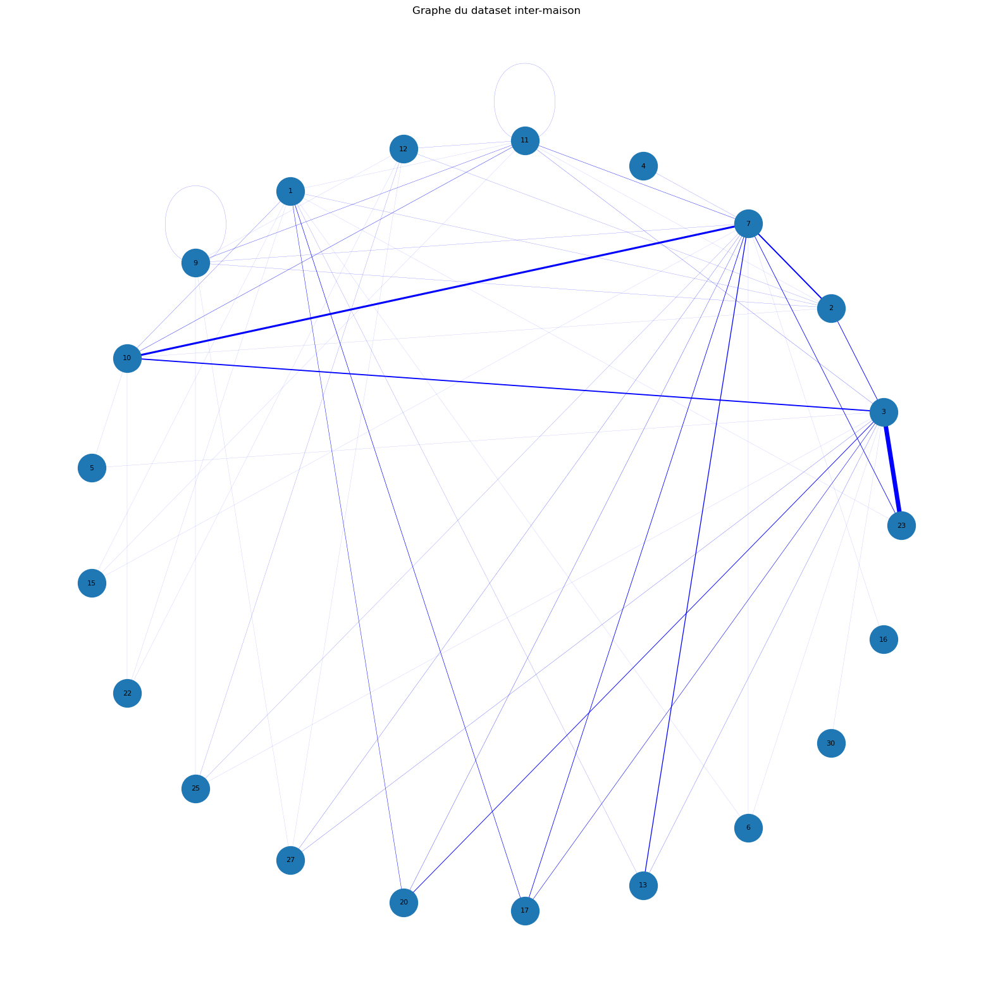

In [6]:
"""
Graphe basique des contacts dataset 2
"""
# Create a graph
G = nx.Graph()

# Add nodes and weighted edges based on the amount of contact
for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'])
    G.add_node(row['ID2_2'])
    contact_weight = row['duration_2']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(20, 20))  # You can adjust the size as needed

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_size=1000)
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)


# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Graphe du dataset inter-maison")
plt.show()

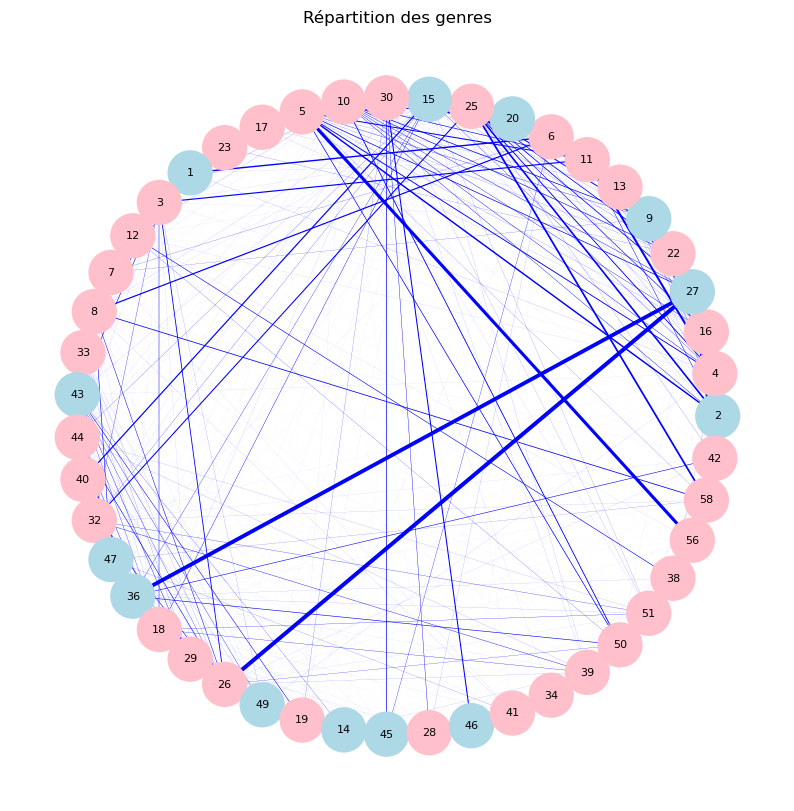

In [7]:
"""
Graphe basique des contacts dataset 1
"""
# Create a graph
G = nx.Graph()

for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], genre=row['genre2_1'])
    contact_weight = row['duration_1']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(10, 10))  # You can adjust the size as needed

# Define your colormap
colormap = {'M': 'lightblue', 'F': 'pink'}

# Create a dictionary to store ID1_1 color assignments
color_dict_id1 = {node: colormap[data['genre']] for node, data in G.nodes(data=True) if 'genre' in data}

# Draw nodes with color based on genre
node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

# Draw labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Répartition des genres")
plt.show()

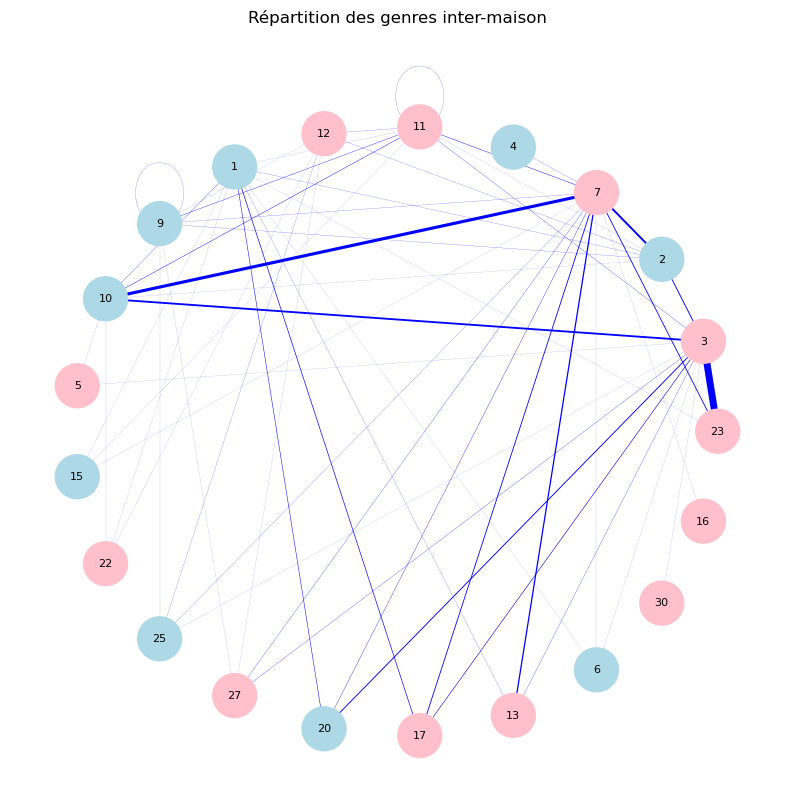

In [8]:
"""
Graphe basique des contacts dataset 1
"""
# Create a graph
G = nx.Graph()

for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], genre=row['genre2_2'])
    contact_weight = row['duration_2']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(10, 10))  # You can adjust the size as needed

# Define your colormap
colormap = {'M': 'lightblue', 'F': 'pink'}

# Create a dictionary to store ID1_1 color assignments
color_dict_id1 = {node: colormap[data['genre']] for node, data in G.nodes(data=True) if 'genre' in data}

# Draw nodes with color based on genre
node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

# Draw labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Répartition des genres inter-maison")
plt.show()

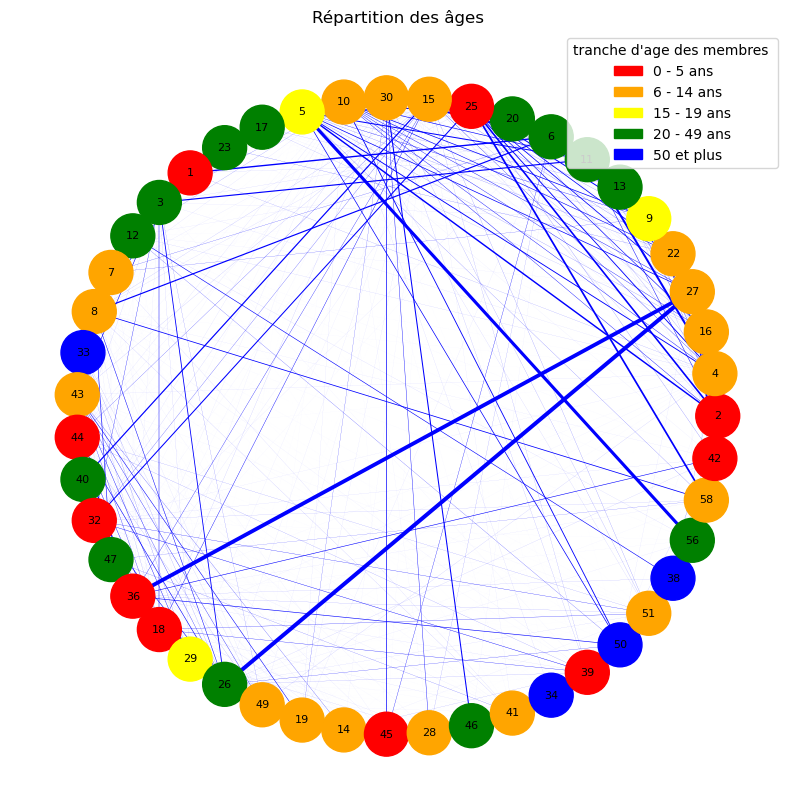

In [9]:
# Create a graph
G = nx.Graph()

for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'])
    contact_weight = row['duration_1']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(10, 10))  # You can adjust the size as needed

# Define your colormap
colormap = {'0': 'red', '1': 'orange', '2': 'yellow', '3': 'green', '4': 'blue'}

# Create a dictionary to store ID1_1 color assignments
color_dict_id1 = {node: colormap[str(data['age'])] for node, data in G.nodes(data=True) if 'age' in data}

# Create legend for the age categories
legend_labels = {
    '0': '0 - 5 ans',
    '1': '6 - 14 ans',
    '2': '15 - 19 ans',
    '3': '20 - 49 ans',
    '4': '50 et plus'
}

# Draw nodes with color based on age
node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

# Draw labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
edges = nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Create legend for the age categories
legend_patches = [mpatches.Patch(color=colormap[str(age)], label=label) for age, label in legend_labels.items()]
plt.legend(handles=legend_patches, title="tranche d'age des membres ", loc='upper right')

# Show the graph
plt.axis('off')
plt.title("Répartition des âges")
plt.show()


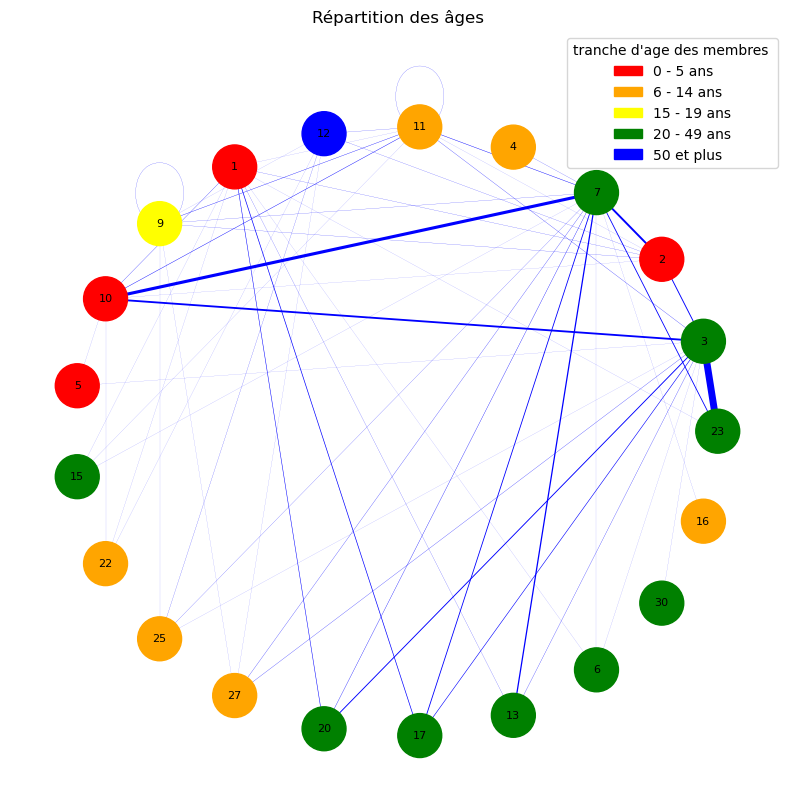

In [10]:
# Create a graph
G = nx.Graph()

for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'])
    contact_weight = row['duration_2']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(10, 10))  # You can adjust the size as needed

# Define your colormap
colormap = {'0': 'red', '1': 'orange', '2': 'yellow', '3': 'green', '4': 'blue'}

# Create a dictionary to store ID1_1 color assignments
color_dict_id1 = {node: colormap[str(data['age'])] for node, data in G.nodes(data=True) if 'age' in data}

# Create legend for the age categories
legend_labels = {
    '0': '0 - 5 ans',
    '1': '6 - 14 ans',
    '2': '15 - 19 ans',
    '3': '20 - 49 ans',
    '4': '50 et plus'
}

# Draw nodes with color based on age
node_color_list = [color_dict_id1.get(node, 'gray') for node in G.nodes()]
nodes = nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_color_list)

# Draw labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
edges = nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Create legend for the age categories
legend_patches = [mpatches.Patch(color=colormap[str(age)], label=label) for age, label in legend_labels.items()]
plt.legend(handles=legend_patches, title="tranche d'age des membres ", loc='upper right')

# Show the graph
plt.axis('off')
plt.title("Répartition des âges")
plt.show()

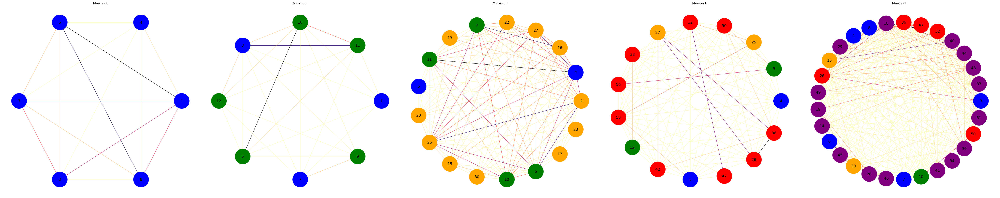

In [11]:
"""
Graphe des différentes maisons dataset 1
"""

# Define your desired order
desired_order = ['L', 'F', 'E', 'B', 'H']

# Set the overall size of the figure
fig, axes = plt.subplots(1, len(desired_order), figsize=(50, 10))

# Change the background color for each subplot
for ax in axes:
    ax.set_facecolor('gray')  # Change 'lightgray' to the desired background color

# Define your colormap
colormap = {'L': 'blue', 'F': 'green', 'E': 'orange', 'B': 'red', 'H': 'purple'}

# Create a dictionary to store Maison1_1 and ID1_1 color assignments
color_dict_maison1 = {}
color_dict_id1 = {}



# Iterate over desired order of 'Maison1_1'
for i, maison_value in enumerate(desired_order):
    # Check if color is already assigned for the Maison1_1 value
    if maison_value not in color_dict_maison1:
        # Assign color for the Maison1_1 value if not assigned
        color_dict_maison1[maison_value] = colormap.get(maison_value, 'gray')

    # Create a subgraph for the specific Maison1_1 value
    subgraph_data = data_1[data_1['Maison1_1'] == maison_value]
    
    # Initialize the graph G for each subplot
    G = nx.Graph()

    # Add nodes and weighted edges based on the amount of contact
    for index, row in subgraph_data.iterrows():
        G.add_node(row['ID1_1'])
        G.add_node(row['ID2_1'])
        contact_weight = row['duration_1']  # Use 'duration_1' as the weight
        if G.has_edge(row['ID1_1'], row['ID2_1']):
            G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
        else:
            G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

    # Draw the circular graph with nodes colored by Maison1_1 color
    pos = nx.circular_layout(G)

    # Ensure consistent color for 'ID1_1' values across subplots
    for id1_value in G.nodes():
        if id1_value not in color_dict_id1:
            color_dict_id1[id1_value] = color_dict_maison1[maison_value]

    node_colors = [color_dict_id1[id1] for id1 in G.nodes()]
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

    # Use edge_cmap to specify a colormap for edge colors based on weights
    nx.draw(G, pos, node_color=node_colors, with_labels=True, node_size=3000, font_size=14, ax=axes[i], edge_color=edge_weights, edge_cmap=plt.cm.magma_r, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))  # Adjust the 'node_size' parameter to control the size

    # Add title for the subplot
    axes[i].set_title(f'Maison {maison_value}')

plt.tight_layout()
plt.show()

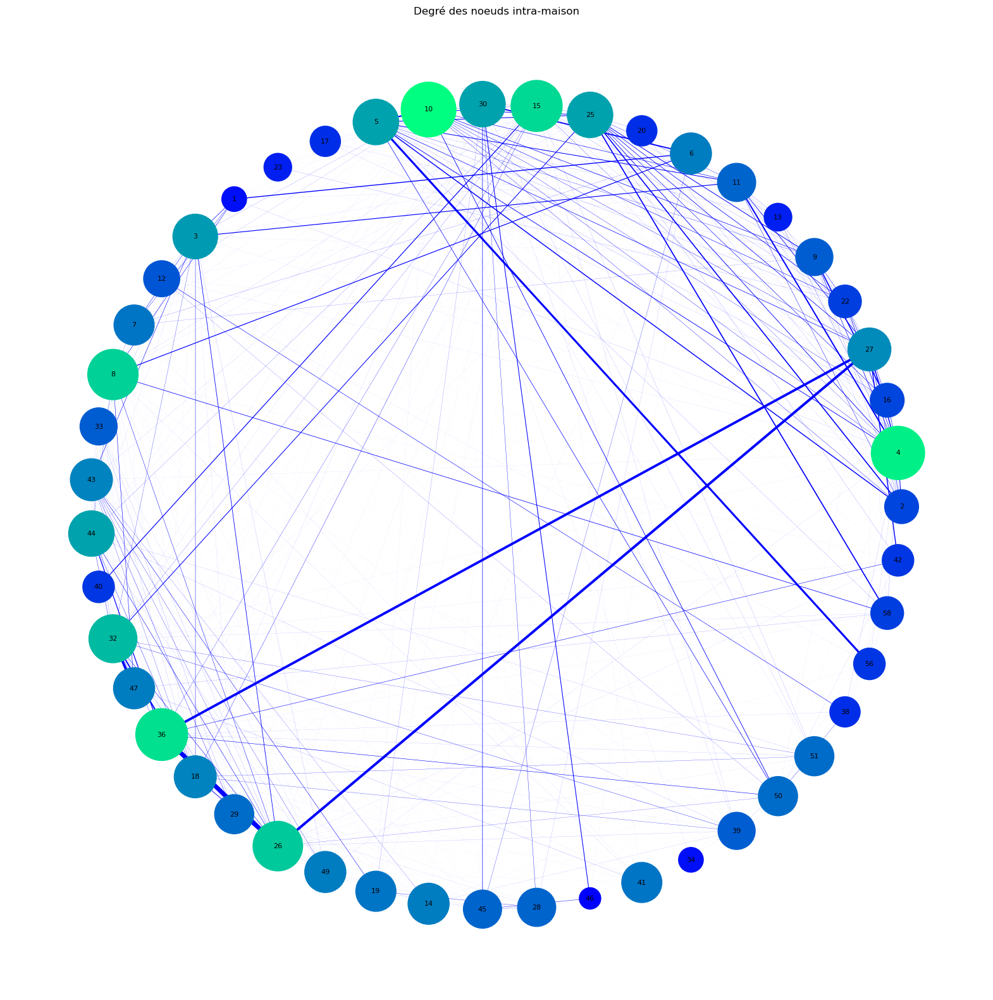

In [12]:
# Create a graph
G = nx.Graph()

# Add nodes and weighted edges based on the amount of contact
for index, row in data_1.iterrows():
    G.add_node(row['ID1_1'])
    G.add_node(row['ID2_1'])
    contact_weight = row['duration_1']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_1'], row['ID2_1']):
        G[row['ID1_1']][row['ID2_1']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_1'], row['ID2_1'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Extract node degrees into a dictionary
node_degrees = dict(G.degree())

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(20, 20))  # You can adjust the size as needed

# Draw nodes with varying sizes based on degrees
node_sizes = [degree * 100 for degree in node_degrees.values()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.winter, node_color=list(node_degrees.values()))

# Draw node labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Degré des noeuds intra-maison")
plt.show()

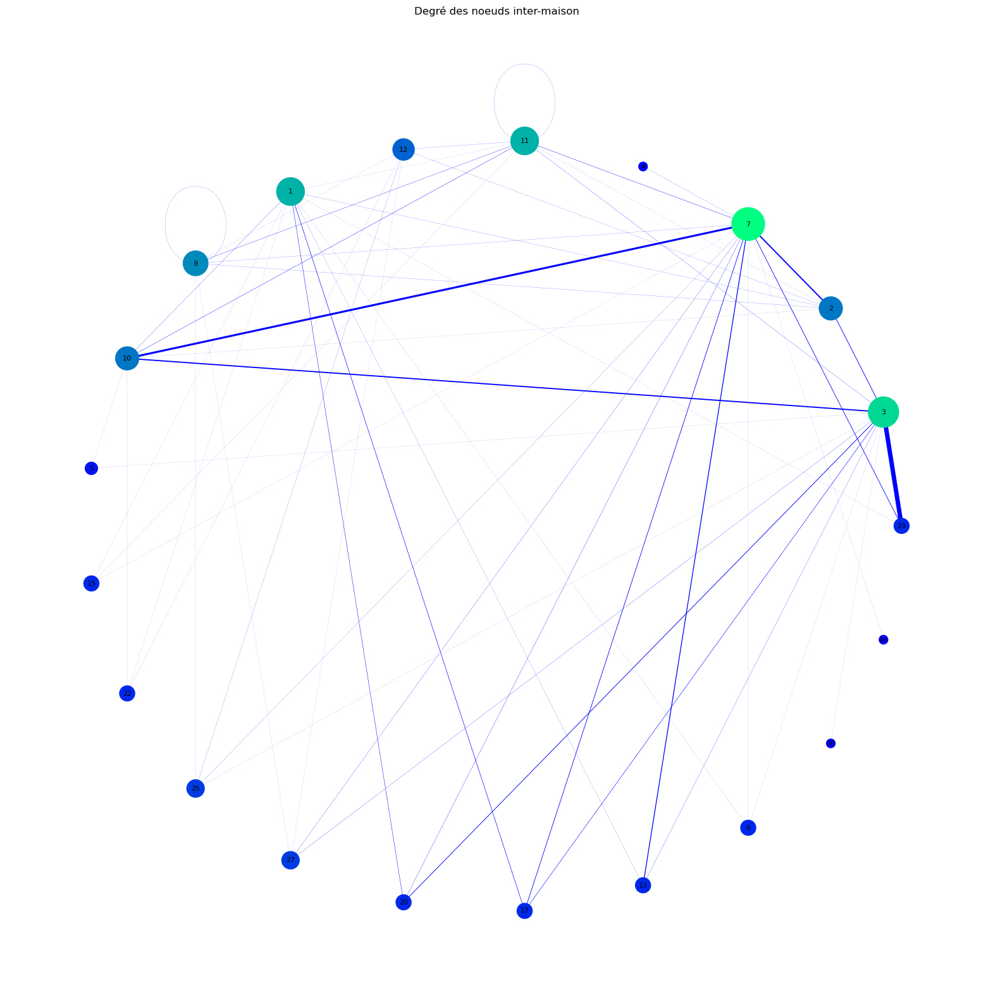

In [13]:
# Create a graph
G = nx.Graph()

# Add nodes and weighted edges based on the amount of contact
for index, row in data_2.iterrows():
    G.add_node(row['ID1_2'])
    G.add_node(row['ID2_2'])
    contact_weight = row['duration_2']  # Use 'duration_1' as the weight
    if G.has_edge(row['ID1_2'], row['ID2_2']):
        G[row['ID1_2']][row['ID2_2']]['weight'] += contact_weight
    else:
        G.add_edge(row['ID1_2'], row['ID2_2'], weight=contact_weight)

# Extract edge weights into a list
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Extract node degrees into a dictionary
node_degrees = dict(G.degree())

# Create a layout for the nodes (e.g., Kamada-Kawai layout)
pos = nx.circular_layout(G)

# Set the figure size
plt.figure(figsize=(20, 20))  # You can adjust the size as needed

# Draw nodes with varying sizes based on degrees
node_sizes = [degree * 100 for degree in node_degrees.values()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.winter, node_color=list(node_degrees.values()))

# Draw node labels
node_labels = {node: node for node in G.nodes()}  # Labels are the node IDs
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

# Draw edges with varying thickness based on weights
edge_widths = [weight / max(edge_weights) * 5 for weight in edge_weights]  # Adjust edge width for visibility
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='b', edge_cmap=plt.cm.Blues, edge_vmin=min(edge_weights), edge_vmax=max(edge_weights))

# Show the graph
plt.axis('off')
plt.title("Degré des noeuds inter-maison")
plt.show()

Mean Proximity Centrality: 0.6504964805319258
Median Proximity Centrality: 0.6388888888888888


C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\286159295.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma')  # You can choose a different colormap
C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\286159295.py:47: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


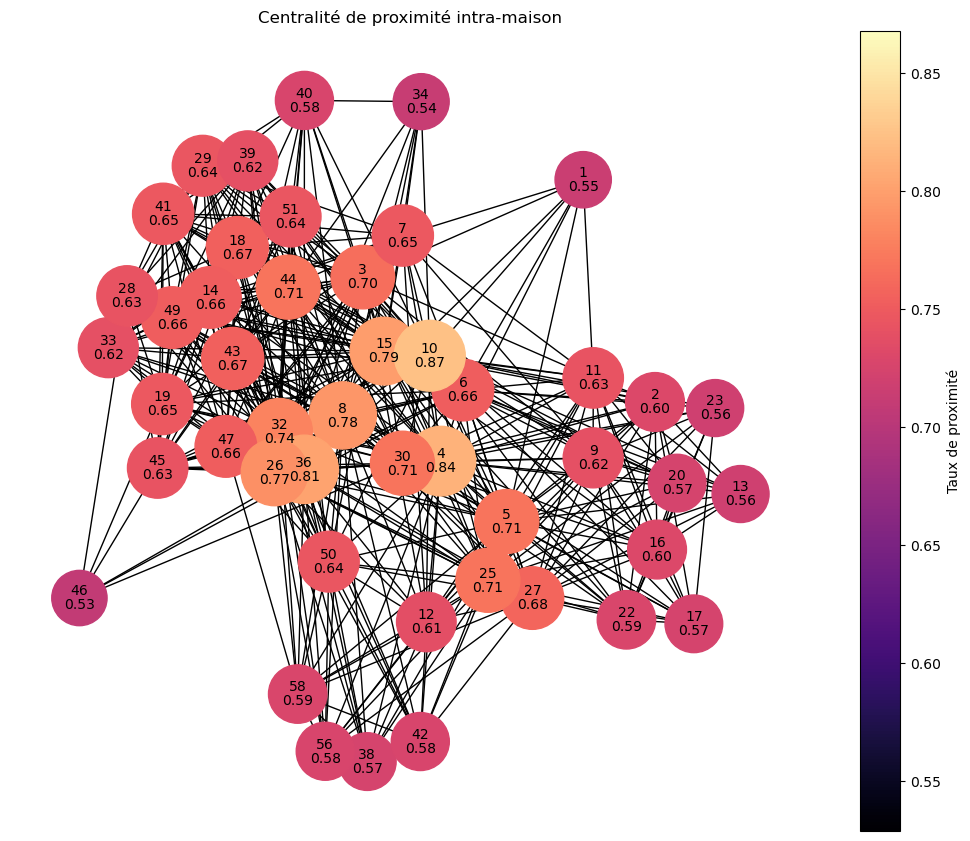

In [54]:
# Create a graph
G = nx.Graph()

# Add nodes with attributes
for i, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'], genre=row['genre2_1'])

    # Add edges between the two nodes
    G.add_edge(row['ID1_1'], row['ID2_1'], duration=row['duration_1'], day=row['day_1'], hour=row['hour_1'])

# Compute proximity centrality
centrality = nx.algorithms.centrality.closeness_centrality(G)

# Calculate the mean and median of the proximity centrality
mean_centrality = sum(centrality.values()) / len(centrality)
median_centrality = statistics.median(centrality.values())

# Print the mean and median
print("Mean Proximity Centrality:", mean_centrality)
print("Median Proximity Centrality:", median_centrality)

# Set custom parameters
node_size = [centrality[node] * 3000 for node in G.nodes]  # You can adjust the multiplier for better visibility
fig_size = (10, 8)
font_size = 10

# Colormap setup
cmap = cm.get_cmap('magma')  # You can choose a different colormap
node_colors = [cmap(centrality[node]) for node in G.nodes]

# Draw the graph
plt.figure(figsize=fig_size)
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

# Add node labels with ID on top and centrality below
id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

centrality_labels = {node: f"{centrality[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=centrality_labels, font_size=font_size, verticalalignment='top')

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(centrality.values()), vmax=max(centrality.values())))
sm.set_array([])  # or sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Taux de proximité')

plt.title('Centralité de proximité intra-maison')
plt.show()

Mean Proximity Centrality: 0.5383311585057012
Median Proximity Centrality: 0.5263157894736842


C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\707718293.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('magma')  # You can choose a different colormap
C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\707718293.py:47: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


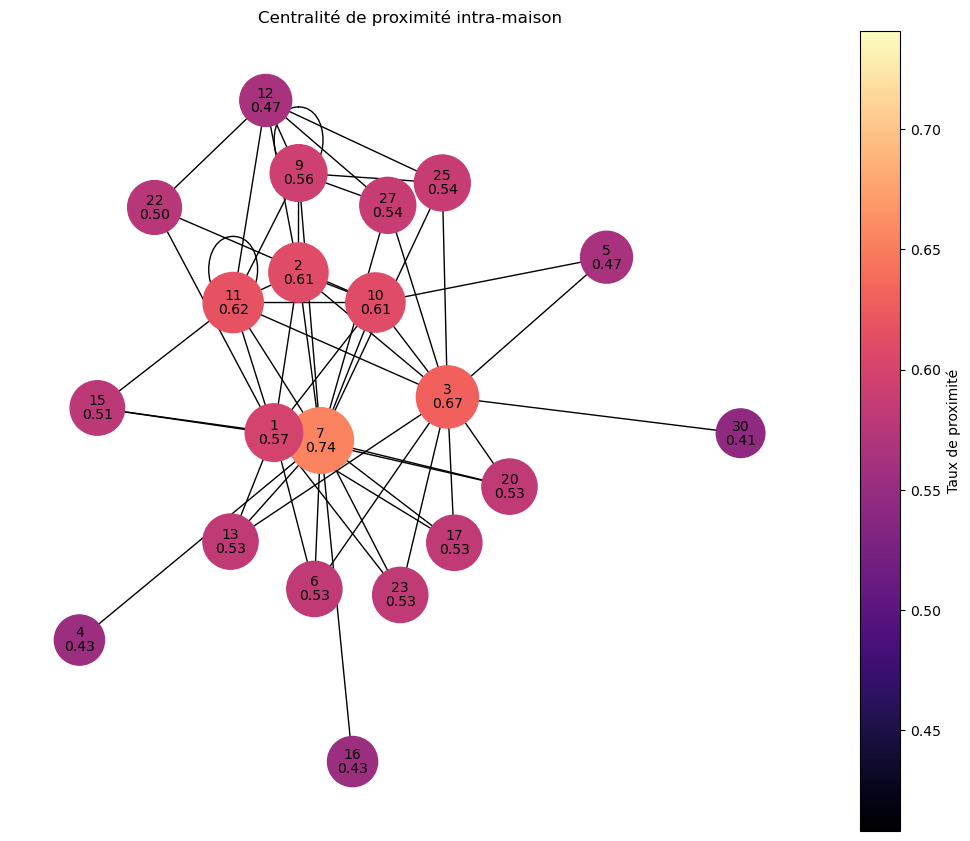

In [55]:
# Create a graph
G = nx.Graph()

# Add nodes with attributes
for i, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'], genre=row['genre2_2'])

    # Add edges between the two nodes
    G.add_edge(row['ID1_2'], row['ID2_2'], duration=row['duration_2'], day=row['day_2'], hour=row['hour_2'])

# Compute proximity centrality
centrality = nx.algorithms.centrality.closeness_centrality(G)

# Calculate the mean and median of the proximity centrality
mean_centrality = sum(centrality.values()) / len(centrality)
median_centrality = statistics.median(centrality.values())

# Print the mean and median
print("Mean Proximity Centrality:", mean_centrality)
print("Median Proximity Centrality:", median_centrality)

# Set custom parameters
node_size = [centrality[node] * 3000 for node in G.nodes]  # You can adjust the multiplier for better visibility
fig_size = (10, 8)
font_size = 10

# Colormap setup
cmap = cm.get_cmap('magma')  # You can choose a different colormap
node_colors = [cmap(centrality[node]) for node in G.nodes]

# Draw the graph
plt.figure(figsize=fig_size)
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

# Add node labels with ID on top and centrality below
id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

centrality_labels = {node: f"{centrality[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=centrality_labels, font_size=font_size, verticalalignment='top')

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(centrality.values()), vmax=max(centrality.values())))
sm.set_array([])  # or sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Taux de proximité')

plt.title('Centralité de proximité intra-maison')
plt.show()

Mean Proximity Centrality: 0.5383311585057012


C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\2705175653.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('plasma')  # You can choose a different colormap
C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\2705175653.py:39: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


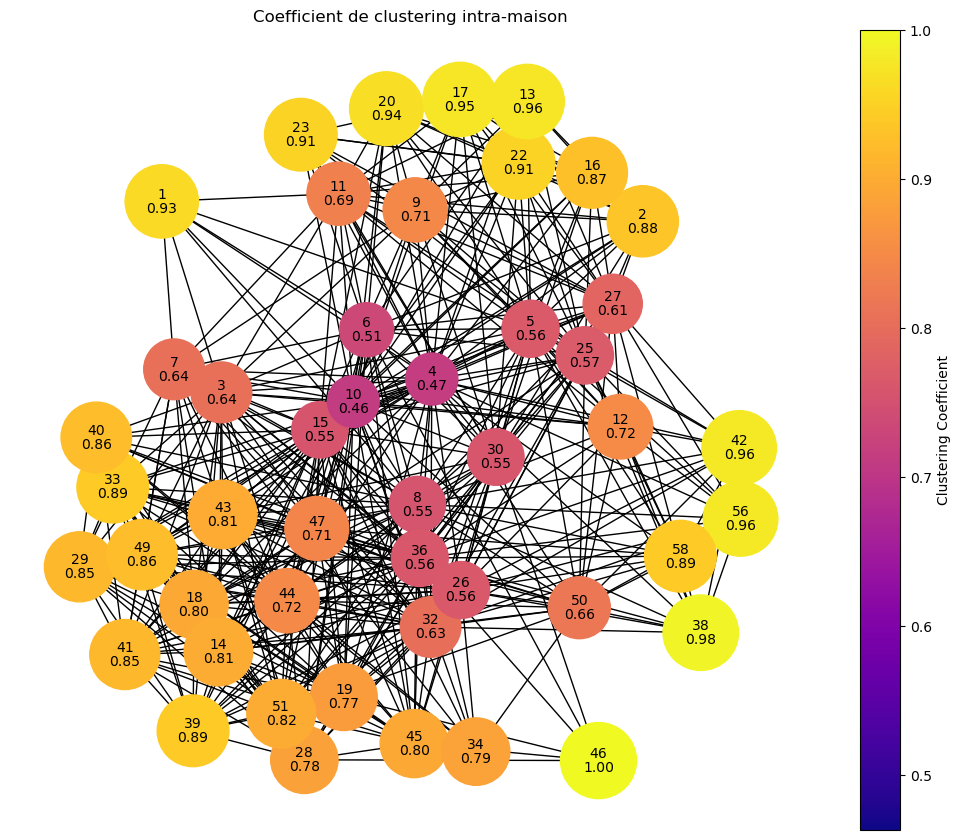

In [16]:
# Create a graph
G = nx.Graph()

# Add nodes with attributes
for i, row in data_1.iterrows():
    G.add_node(row['ID1_1'], age=row['age1_1'], genre=row['genre1_1'])
    G.add_node(row['ID2_1'], age=row['age2_1'], genre=row['genre2_1'])

    # Add edges between the two nodes
    G.add_edge(row['ID1_1'], row['ID2_1'], duration=row['duration_1'], day=row['day_1'], hour=row['hour_1'])

# Compute clustering coefficients
clustering_coefficients = nx.clustering(G)

# Set custom parameters
node_size = [clustering_coefficients[node] * 3000 for node in G.nodes]  # Adjust the multiplier for better visibility
fig_size = (10, 8)
font_size = 10

# Colormap setup
cmap = cm.get_cmap('plasma')  # You can choose a different colormap
node_colors = [cmap(clustering_coefficients[node]) for node in G.nodes]

# Draw the graph
plt.figure(figsize=fig_size)
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

# Add node labels with IDs on top and clustering coefficient below
id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

coeff_labels = {node: f"{clustering_coefficients[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=coeff_labels, font_size=font_size, verticalalignment='top')

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(clustering_coefficients.values()), vmax=max(clustering_coefficients.values())))
sm.set_array([])  # or sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Clustering Coefficient')

plt.title('Coefficient de clustering intra-maison')
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\1146284075.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('plasma')  # You can choose a different colormap
C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\1146284075.py:39: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)


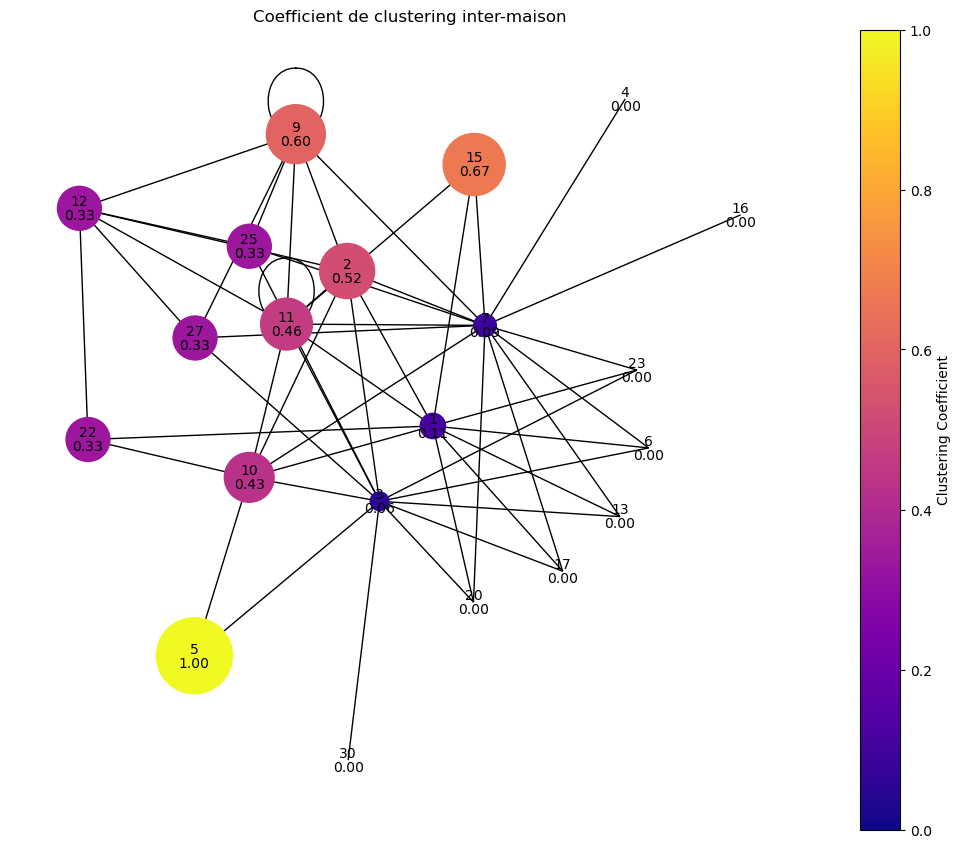

In [17]:
# Create a graph
G = nx.Graph()

# Add nodes with attributes
for i, row in data_2.iterrows():
    G.add_node(row['ID1_2'], age=row['age1_2'], genre=row['genre1_2'])
    G.add_node(row['ID2_2'], age=row['age2_2'], genre=row['genre2_2'])

    # Add edges between the two nodes
    G.add_edge(row['ID1_2'], row['ID2_2'], duration=row['duration_2'], day=row['day_2'], hour=row['hour_2'])

# Compute clustering coefficients
clustering_coefficients = nx.clustering(G)

# Set custom parameters
node_size = [clustering_coefficients[node] * 3000 for node in G.nodes]  # Adjust the multiplier for better visibility
fig_size = (10, 8)
font_size = 10

# Colormap setup
cmap = cm.get_cmap('plasma')  # You can choose a different colormap
node_colors = [cmap(clustering_coefficients[node]) for node in G.nodes]

# Draw the graph
plt.figure(figsize=fig_size)
pos = nx.kamada_kawai_layout(G)
nx.draw(G, pos, with_labels=False, node_size=node_size, font_size=font_size, node_color=node_colors, cmap=cmap)

# Add node labels with IDs on top and clustering coefficient below
id_labels = {node: str(node) for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=id_labels, font_size=font_size, verticalalignment='bottom')

coeff_labels = {node: f"{clustering_coefficients[node]:.2f}" for node in G.nodes}
nx.draw_networkx_labels(G, pos, labels=coeff_labels, font_size=font_size, verticalalignment='top')

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(clustering_coefficients.values()), vmax=max(clustering_coefficients.values())))
sm.set_array([])  # or sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', pad=0.05)
cbar.set_label('Clustering Coefficient')

plt.title('Coefficient de clustering inter-maison')
plt.show()

In [18]:
# Les différents membres de chaque maisons.
household_counts = data_2.groupby('Maison1_2')['ID1_2'].nunique().reset_index(name='MemberCount')

# Display the counts for each Maison1_1
print(household_counts)

  Maison1_2  MemberCount
0         E           11
1         F            3
2         L            3


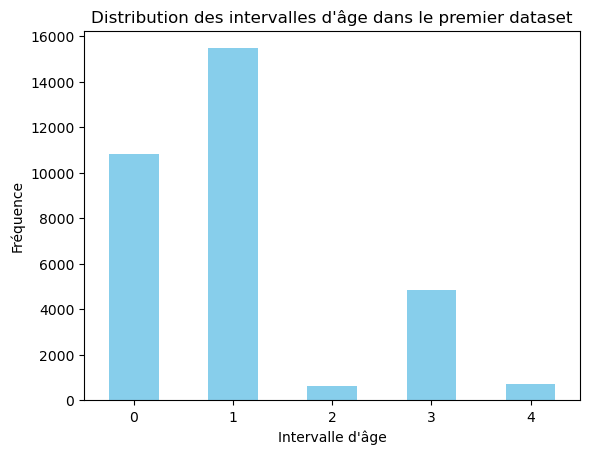

In [19]:
# Sélectionnez la colonne 'age1_1' du premier dataset
age_intervals = data_1['age1_1']

# Comptez le nombre d'occurrences de chaque intervalle
age_interval_counts = age_intervals.value_counts()

# Triez les intervalles par ordre croissant
age_interval_counts = age_interval_counts.sort_index()

# Créez un graphique à barres
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le premier dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)  # Pour faire pivoter les étiquettes de l'axe x
plt.show()

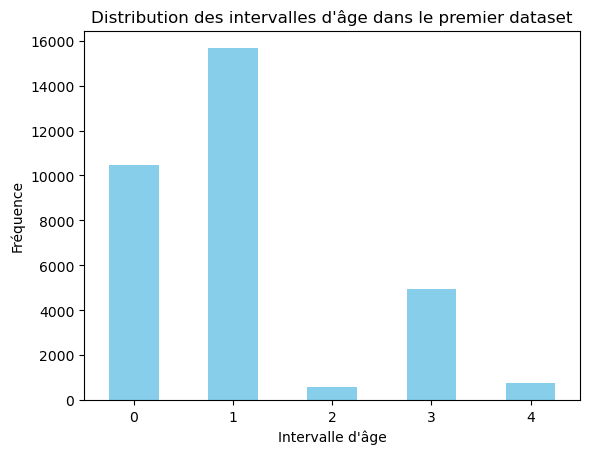

In [20]:
# Sélectionnez la colonne 'age1_1' du premier dataset
age_intervals = data_1['age2_1']

# Comptez le nombre d'occurrences de chaque intervalle
age_interval_counts = age_intervals.value_counts()

# Triez les intervalles par ordre croissant
age_interval_counts = age_interval_counts.sort_index()

# Créez un graphique à barres
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le premier dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)  # Pour faire pivoter les étiquettes de l'axe x
plt.show()

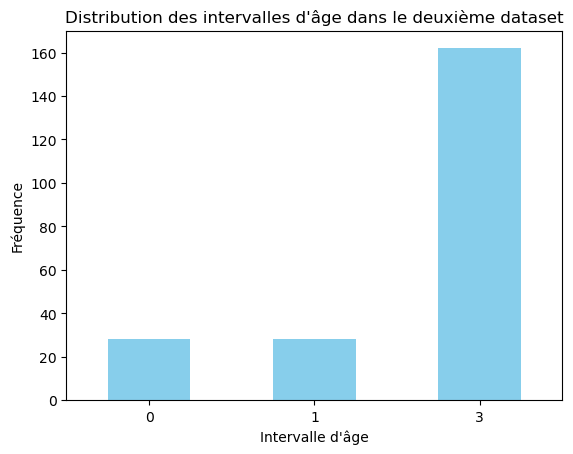

In [21]:
# Sélectionnez la colonne 'age1_1' du deuxième dataset
age_intervals = data_2['age1_2']

# Comptez le nombre d'occurrences de chaque intervalle
age_interval_counts = age_intervals.value_counts()

# Triez les intervalles par ordre croissant
age_interval_counts = age_interval_counts.sort_index()

# Créez un graphique à barres
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le deuxième dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)  # Pour faire pivoter les étiquettes de l'axe x
plt.show()

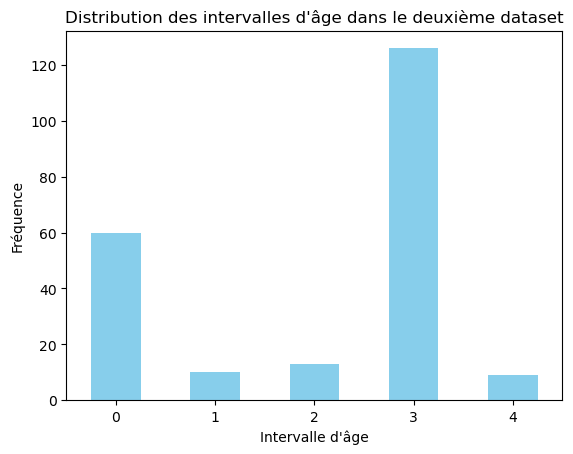

In [22]:
# Sélectionnez la colonne 'age1_1' du deuxième dataset
age_intervals = data_2['age2_2']

# Comptez le nombre d'occurrences de chaque intervalle
age_interval_counts = age_intervals.value_counts()

# Triez les intervalles par ordre croissant
age_interval_counts = age_interval_counts.sort_index()

# Créez un graphique à barres
age_interval_counts.plot(kind='bar', color='skyblue')
plt.title("Distribution des intervalles d'âge dans le deuxième dataset")
plt.xlabel("Intervalle d'âge")
plt.ylabel("Fréquence")
plt.xticks(rotation=0)  # Pour faire pivoter les étiquettes de l'axe x
plt.show()

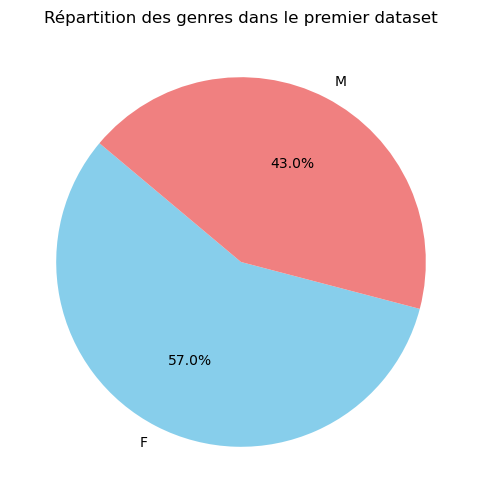

In [23]:
# Sélectionnez la colonne 'genre1_1' du premier dataset
gender_counts = data_1['genre1_1'].value_counts()

# Créez un graphique à secteurs
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

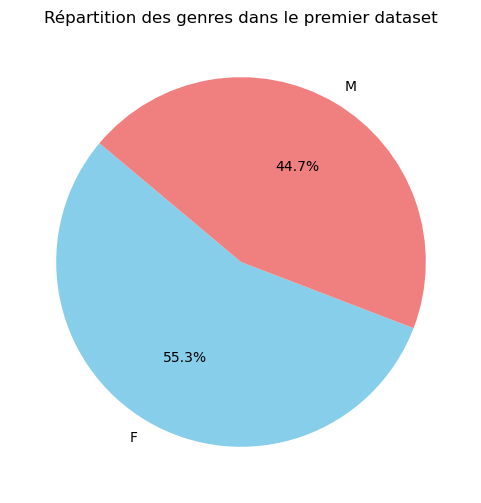

In [24]:
# Sélectionnez la colonne 'genre1_1' du premier dataset
gender_counts = data_1['genre2_1'].value_counts()

# Créez un graphique à secteurs
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

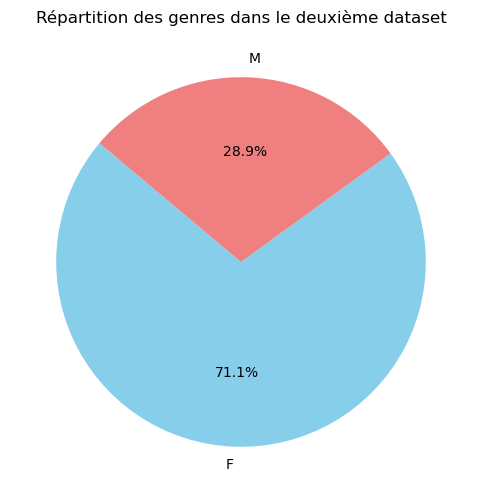

In [25]:
# Sélectionnez la colonne 'genre1_1' du premier dataset
gender_counts = data_2['genre1_2'].value_counts()

# Créez un graphique à secteurs
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le deuxième dataset")
plt.show()

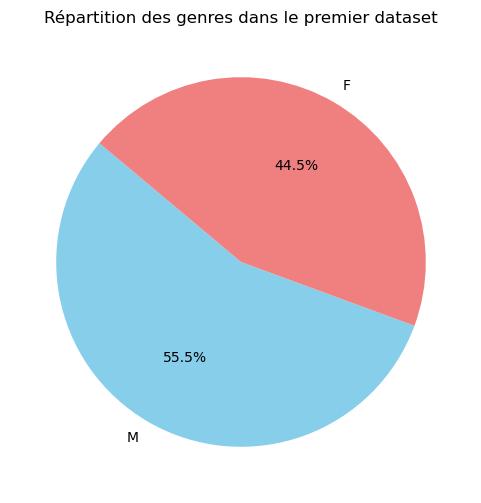

In [26]:
# Sélectionnez la colonne 'genre1_1' du premier dataset
gender_counts = data_2['genre2_2'].value_counts()

# Créez un graphique à secteurs
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral'])
plt.title("Répartition des genres dans le premier dataset")
plt.show()

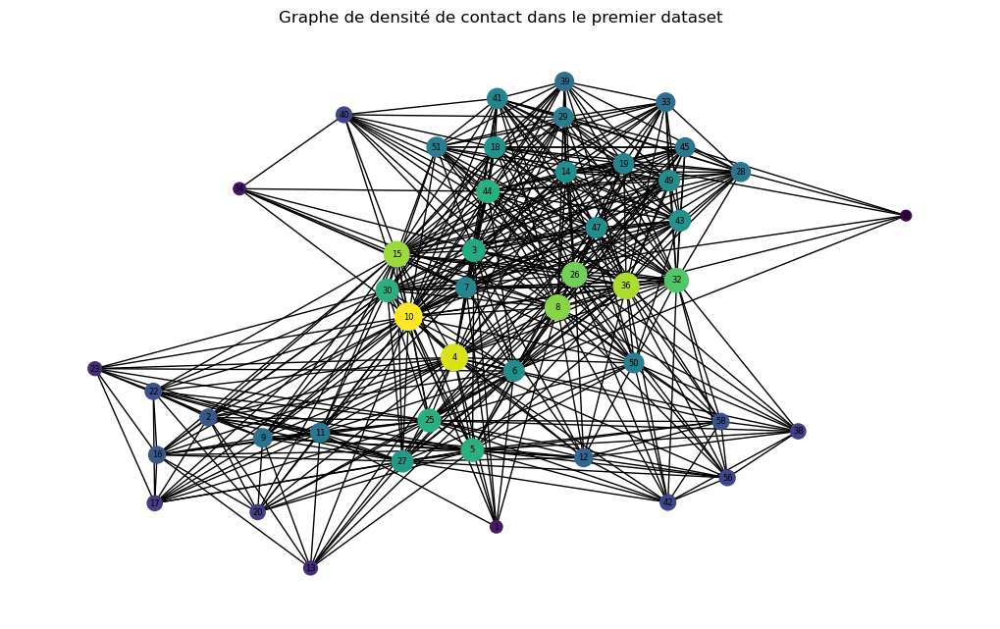

In [27]:
# Créez un graph à partir du premier dataset
G = nx.Graph()

# Ajoutez des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])

# Ajoutez des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

# Calculez la densité de contact (degré moyen) pour chaque nœud
contact_density = dict(G.degree())
average_density = np.mean(list(contact_density.values()))

# Créez un graphe de densité de contact
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=[v * 10 for v in contact_density.values()], node_color=list(contact_density.values()), cmap=plt.cm.viridis, font_size=6)
plt.title("Graphe de densité de contact dans le premier dataset")
#plt.colorbar()
plt.show()

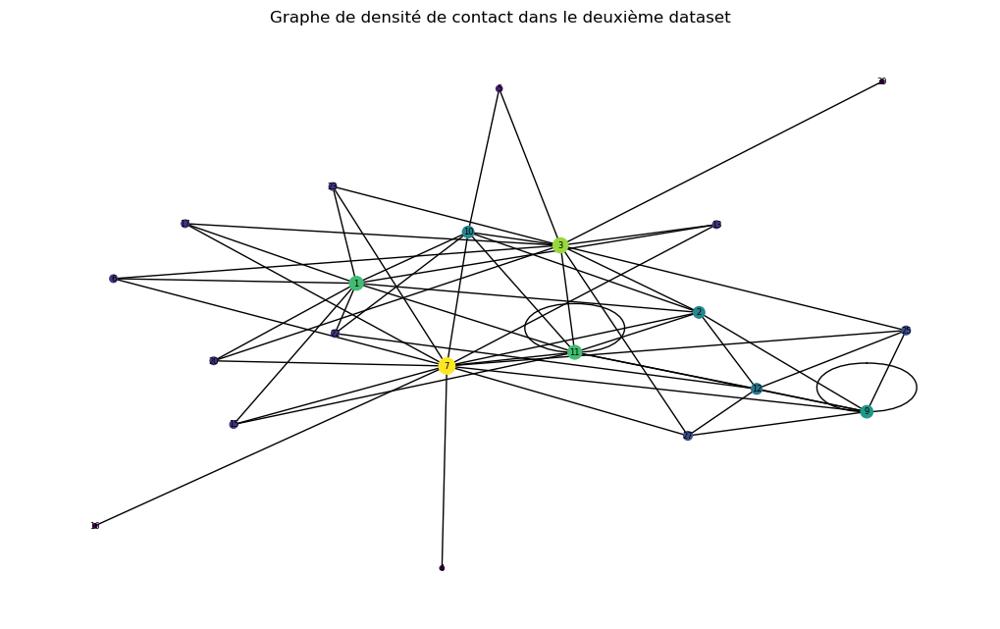

In [28]:
# Créez un graph à partir du deuxième dataset
G = nx.Graph()

# Ajoutez des nœuds en tant que personnes des colonnes 'ID1_2' et 'ID2_2'
G.add_nodes_from(data_2['ID1_2'])
G.add_nodes_from(data_2['ID2_2'])

# Ajoutez des arêtes (liens) entre les personnes en utilisant 'ID1_2' et 'ID2_2'
G.add_edges_from(data_2[['ID1_2', 'ID2_2']].values)

# Calculez la densité de contact (degré moyen) pour chaque nœud
contact_density = dict(G.degree())
average_density = np.mean(list(contact_density.values()))

# Créez un graphe de densité de contact
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=[v * 10 for v in contact_density.values()], node_color=list(contact_density.values()), cmap=plt.cm.viridis, font_size=6)
plt.title("Graphe de densité de contact dans le deuxième dataset")
#plt.colorbar()
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\415333042.py:27: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label="Densité de contact")


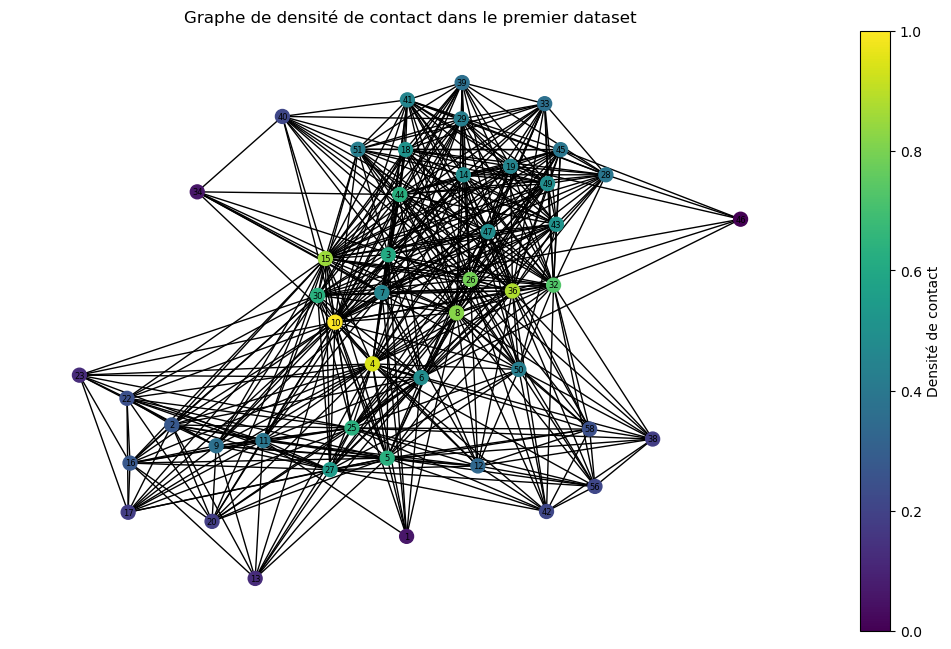

In [29]:
# Créez un graph à partir du premier dataset
G = nx.Graph()

# Ajoutez des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])

# Ajoutez des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

# Calculez la densité de contact (degré moyen) pour chaque nœud
contact_density = dict(G.degree())
average_density = np.mean(list(contact_density.values()))

# Créez un graphe de densité de contact en utilisant une carte de couleur
plt.figure(figsize=(10, 6))
pos = nx.spring_layout(G, seed=42)

# Utilisez la couleur viridis en fonction de la densité de contact
node_colors = [contact_density[n] for n in G.nodes()]
cmap = plt.get_cmap('viridis')

nx.draw(G, pos, with_labels=True, node_size=100, node_color=node_colors, cmap=cmap, font_size=6)

sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
plt.colorbar(sm, label="Densité de contact")

plt.title("Graphe de densité de contact dans le premier dataset")
plt.show()

c:\ProgramData\anaconda3\Lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\4291128484.py:19: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=max(betweenness_centrality.values()))))


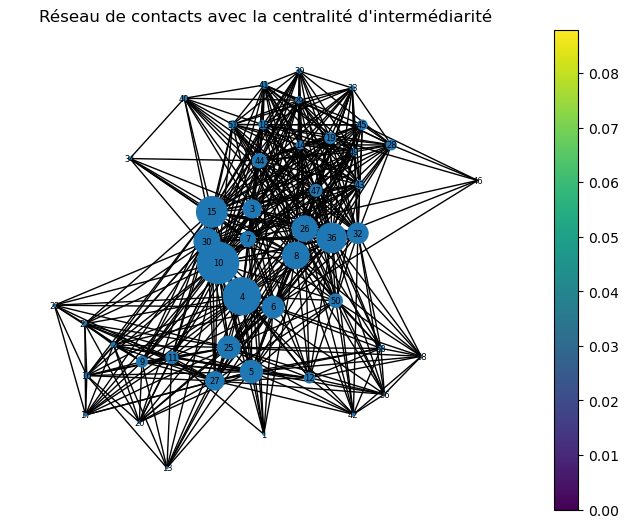

In [30]:
# Créer un graph à partir du premier dataset
G = nx.Graph()

# Ajouter des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])

# Ajouter des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

# Calculer la centralité d'intermédiarité
betweenness_centrality = nx.betweenness_centrality(G)

# Dessiner le graph en fonction de la centralité d'intermédiarité
node_size = [10000 * betweenness_centrality[node] for node in G.nodes]
pos = nx.spring_layout(G, seed=42)  # Dispose les nœuds pour une meilleure visualisation
nx.draw(G, pos, with_labels=True, node_size=node_size, font_size=6, cmap=plt.cm.viridis)
plt.title("Réseau de contacts avec la centralité d'intermédiarité")
plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=max(betweenness_centrality.values()))))
plt.show()

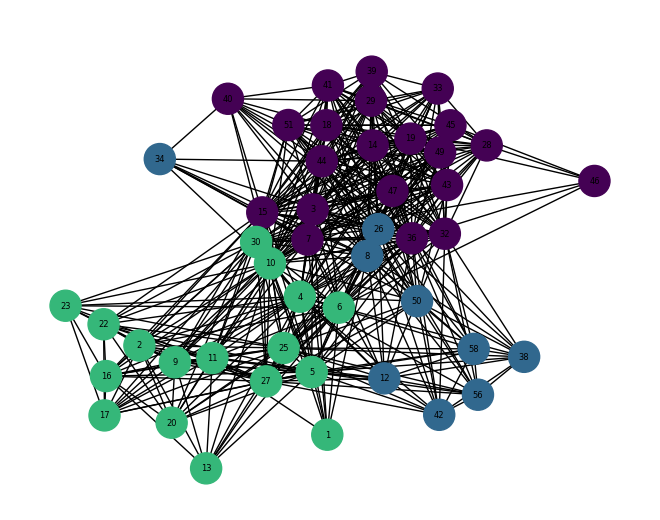

In [31]:
# Créer un graph à partir du premier dataset
G = nx.Graph()

# Ajouter des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G.add_nodes_from(data_1['ID1_1'])
G.add_nodes_from(data_1['ID2_1'])

# Ajouter des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)

# Détection de communautés
partition = cl.best_partition(G)

# Dessiner le graph en fonction des communautés
pos = nx.spring_layout(G, seed=42)  # Dispose les nœuds pour une meilleure visualisation
cmap = plt.get_cmap("viridis")
size = len(set(partition.values()))
colors = [cmap(i / size) for i in range(size)]
color_map = [colors[partition[node]] for node in G.nodes]
nx.draw(G, pos, with_labels=True, node_color=color_map, node_size=500, font_size=6)
plt.title(" ")
plt.show()

In [32]:
def louvain_graph(G):
    # Community detection with the Louvain method
    partition = cl.best_partition(G)

    # Draw the graph with community assignments
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(G)  # positions for all nodes
    # color the nodes according to their partition
    cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                        cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.title("Community Detection with Louvain Method")
    plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\425367140.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)


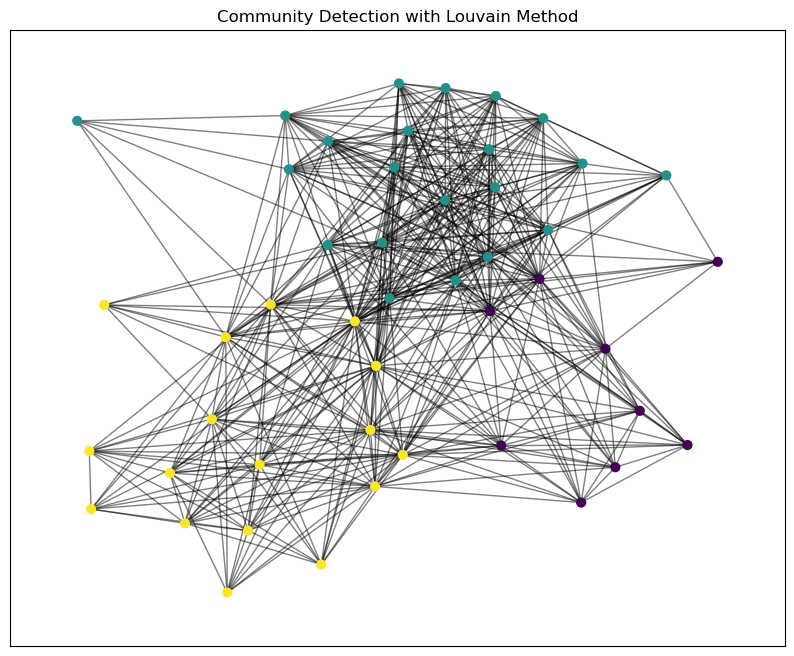

C:\Users\Administrator\AppData\Local\Temp\ipykernel_13112\425367140.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis', max(partition.values()) + 1)


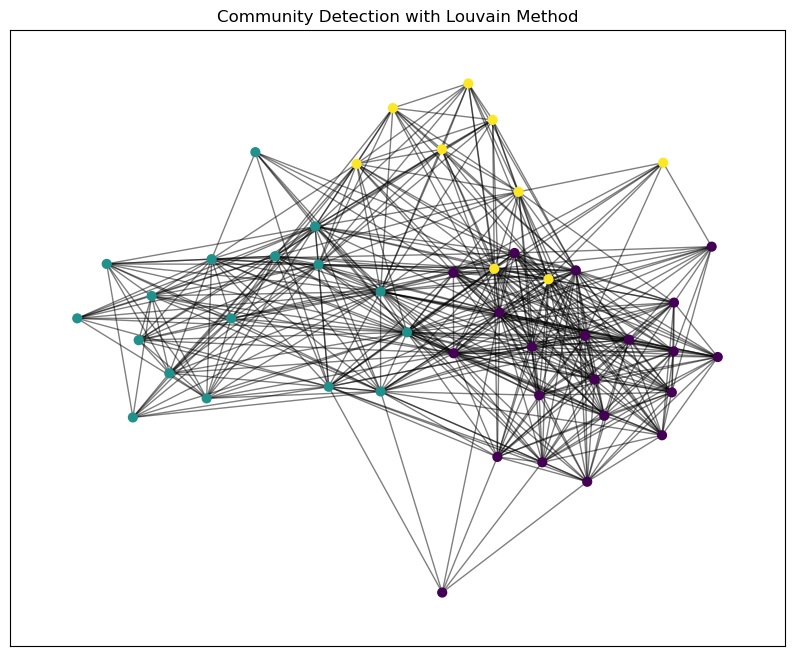

In [33]:
# Créer un graph à partir du premier dataset
G1 = nx.Graph()

# Ajouter des nœuds en tant que personnes des colonnes 'ID1_1' et 'ID2_1'
G1.add_nodes_from(data_1['ID1_1'])
G1.add_nodes_from(data_1['ID2_1'])

# Ajouter des arêtes (liens) entre les personnes en utilisant 'ID1_1' et 'ID2_1'
G1.add_edges_from(data_1[['ID1_1', 'ID2_1']].values)
louvain_graph(G1)



# Créer un graph à partir du deuxième dataset
G2 = nx.Graph()

# Ajouter des nœuds en tant que personnes des colonnes 'ID1_2' et 'ID2_2'
G2.add_nodes_from(data_2['ID1_2'])
G2.add_nodes_from(data_2['ID2_2'])

# Ajouter des arêtes (liens) entre les personnes en utilisant 'ID1_2' et 'ID2_2'
G2.add_edges_from(data_2[['ID1_2', 'ID2_2']].values)
louvain_graph(G)

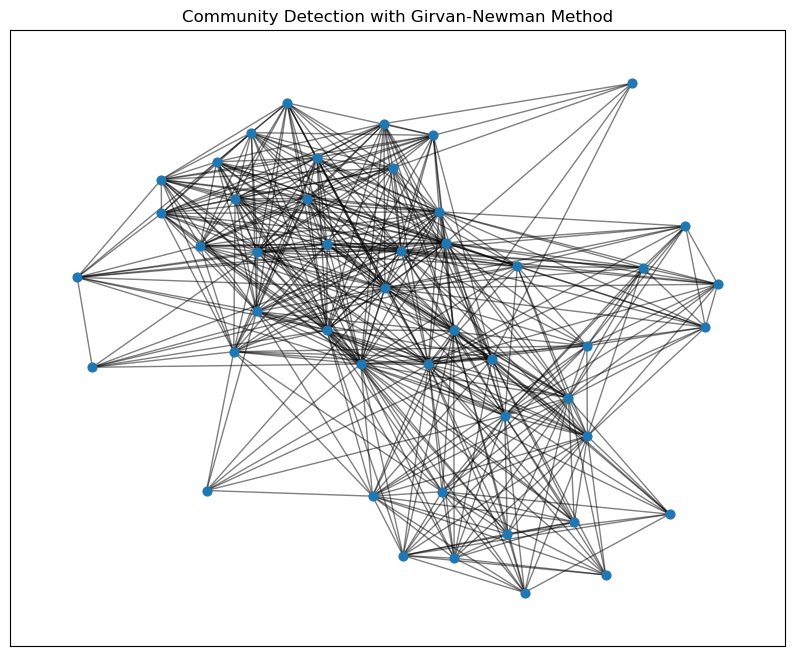

In [34]:
# Alternatively, using the Girvan-Newman method
from networkx.algorithms.community import girvan_newman

# Apply the Girvan-Newman algorithm
communities = next(girvan_newman(G))

# Draw the graph with community assignments
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)
for community in communities:
    nx.draw_networkx_nodes(G, pos, community, node_size=40)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title("Community Detection with Girvan-Newman Method")
plt.show()

In [35]:
from scipy.stats import ks_2samp

# Define the function to compare degree distributions
def compare_degree_distributions(G1, G2):
    degrees1 = [G1.degree(n) for n in G1.nodes()]
    degrees2 = [G2.degree(n) for n in G2.nodes()]
    
    # Perform the Kolmogorov-Smirnov test
    ks_stat, ks_p_value = ks_2samp(degrees1, degrees2)
    
    # Visual comparison of degree distributions
    plt.figure(figsize=(12, 5))
    plt.hist(degrees1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(degrees2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title("Comparaison de la distribution de degré")
    plt.xlabel("Degré")
    plt.ylabel("Fréquence")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

# Define the function to compare clustering coefficients
def compare_clustering_coefficients(G1, G2):
    clustering1 = list(nx.clustering(G1).values())
    clustering2 = list(nx.clustering(G2).values())
    
    # Perform the Kolmogorov-Smirnov test
    ks_stat, ks_p_value = ks_2samp(clustering1, clustering2)
    
    # Visual comparison of clustering coefficients
    plt.figure(figsize=(12, 5))
    plt.hist(clustering1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(clustering2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title("Clustering Coefficient Distribution Comparison")
    plt.xlabel("Clustering Coefficient")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

# Define the function to compare centrality distributions
def compare_centrality_distributions(G1, G2, centrality_measure=nx.betweenness_centrality):
    centrality1 = list(centrality_measure(G1).values())
    centrality2 = list(centrality_measure(G2).values())
    
    # Perform the Kolmogorov-Smirnov test
    ks_stat, ks_p_value = ks_2samp(centrality1, centrality2)
    
    # Visual comparison of centrality distributions
    plt.figure(figsize=(12, 5))
    plt.hist(centrality1, bins=30, alpha=0.5, label='Graphe Intra-maison')
    plt.hist(centrality2, bins=30, alpha=0.5, label='Graphe Inter-maison')
    plt.title(f"{centrality_measure.__name__.capitalize()} Centrality Distribution Comparison")
    plt.xlabel("Centrality")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()
    
    return ks_stat, ks_p_value

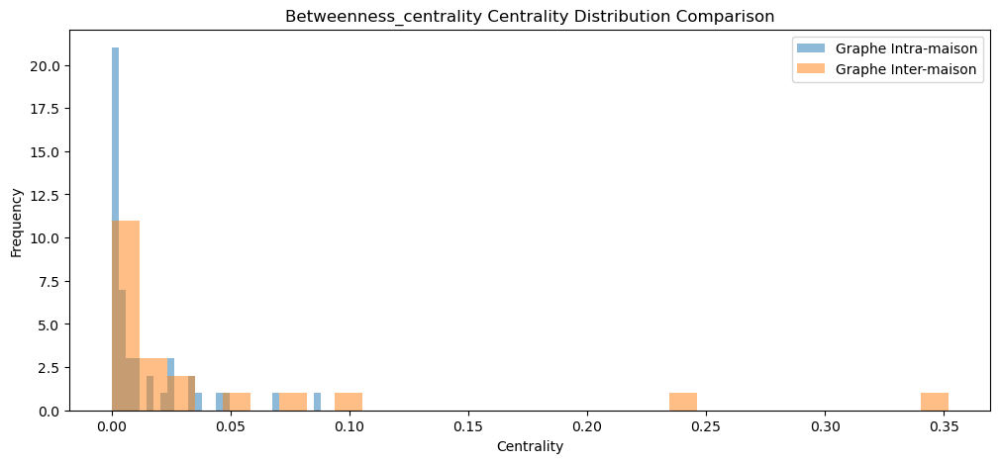

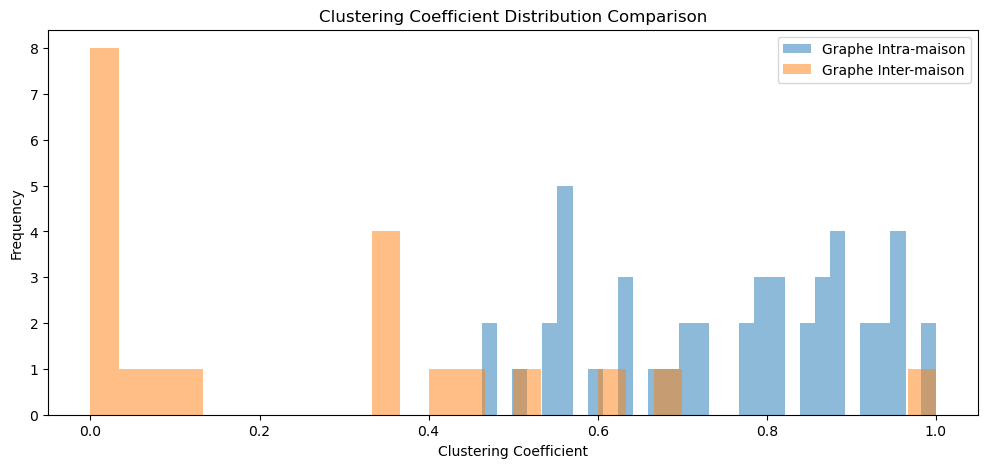

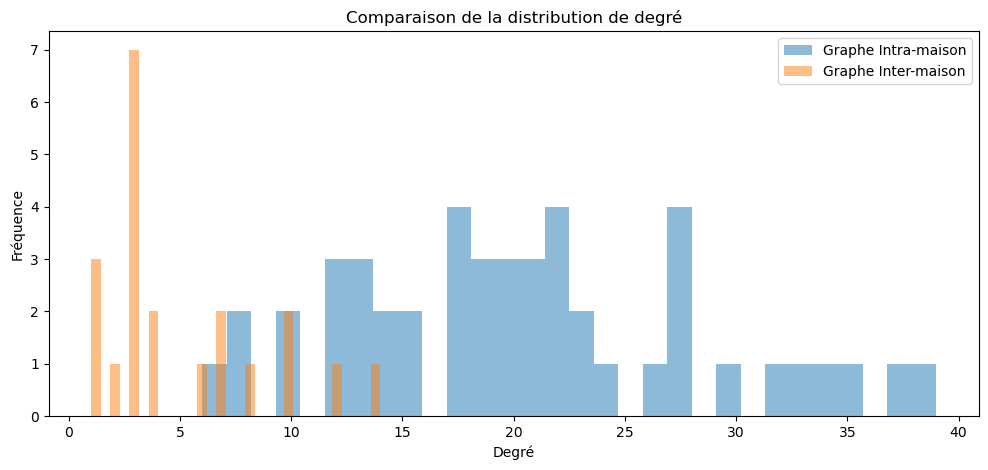

(0.7983789260385005, 9.106084659365544e-10)

In [36]:
compare_centrality_distributions(G1, G2, centrality_measure=nx.betweenness_centrality)
compare_clustering_coefficients(G1, G2)
compare_degree_distributions(G1, G2)